In [1]:
'''Basic package'''
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import cv2
import numpy as np
import pandas as pd
import random
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt

# 自定義 library
from generator import data_generators
from callbacks import *

'''Tensorflow package'''
import tensorflow as tf

'''Data augmentation package'''
from imgaug import augmenters as iaa
import imgaug as ia


# Config 

In [2]:
# input image
img_size = 256
data_list = 'data_list/'

# model
model_name= 'pix2pix'
batch_size = 5
nb_epoch = 150
n_batch = 368
L1_lambda = 100

# Preprocess 

In [3]:
def preprocessed_img(img_list, aug = False):
    
    x, y = [], []
    file = []
    
    for idx, row in img_list.iterrows():
        A = row['A'] #.png
        B = row['B'] #.jpg
        ID = row[0]
        
        A = cv2.imread(A)
        B = cv2.imread(B)
        A = A[:, :, ::-1] #BGR -> GRB
        B = B[:, :, ::-1]
        
        A = cv2.resize(A, (img_size+30, img_size+30))
        B = cv2.resize(B, (img_size+30, img_size+30))
        r_x = np.random.randint(0, 30)
        r_y = np.random.randint(0, 30)
        A = A[r_x:r_x+img_size, r_y:r_y+img_size, :]
        B = B[r_x:r_x+img_size, r_y:r_y+img_size, :]
        
        seq = iaa.Sequential([iaa.Fliplr(0.5)])
        seq.to_deterministic()
        
        A = seq.augment_images(A)
        B = seq.augment_images(B)
        
        A = ((A.astype('float32')/255.) - 0.5) * 2
        B = ((B.astype('float32')/255.) - 0.5) * 2
        
        x.append(A)
        y.append(B)
        file.append(ID)
    
    x = np.array(x)
    y = np.array(y)
        
    return x, y, file

# Callback 

In [4]:
model_dict = {
    'model_name' : model_name,
    'checkpoint' : Model_checkpoint(os.path.join('model', model_name), save_best_only=False),
    'train_batch_log' : History(['g_loss', 'd_loss']),
    'val_batch_log' : History(['g_loss', 'd_loss']),
    'history' : {
        'train_g_loss':[],
        'train_d_loss':[],
        'val_g_loss':[],
        'val_d_loss':[]
    }
}

callback_dict = {
    'on_session_begin':[], # start of a session
    'on_batch_begin':[], # start of a training batch
    'on_batch_end':[], # end of a training batch
    'on_epoch_begin':[], # start of a epoch
    'on_epoch_end':[
        model_dict['checkpoint']
    ], # end of a epoch
    'on_session_end':[] # end of a session
}
callback_manager = Run_collected_functions(callback_dict)

# Load data 

In [5]:
train_df = pd.read_csv(os.path.join(data_list, 'train.csv'))
val_df = pd.read_csv(os.path.join(data_list, 'val.csv'))

In [6]:
generators = data_generators(batch_size, [train_df, val_df], preprocessed_img)

In [7]:
generators.load_val()
generators.start_train_threads()

/opt/conda/lib/python3.6/site-packages/imgaug/augmenters/meta.py:313: UserWarning: You provided a numpy array of shape (256, 256, 3) as input to augment_images(), which was interpreted as (N, H, W). The last dimension however has value 1 or 3, which indicates that you provided a single image with shape (H, W, C) instead. If that is the case, you should use augment_image(image) or augment_images([image]), otherwise you will not get the expected augmentations.
  "you will not get the expected augmentations." % (images_copy.shape,))


# Train 

In [8]:
def generator(x, dim, out_dim, is_training):
    '''
    論文當中的 generator 採用 U-Net，前半段 Encoder feature maps 連結到後半段 Decoder 對應 feature maps
    '''
    # encoder, decoder 每層 filter 數量
    e_dims = [dim] + [dim*2] + [dim*4] + [dim*8]*5
    d_dims = e_dims[::-1][1:]
    e_list = []
    
    with tf.variable_scope('generator', reuse=tf.AUTO_REUSE):
        # Encoder: 影像->特徵向量
        for i in range(8):
            if i == 0:
                x = tf.layers.conv2d(x, e_dims[i], (4, 4), strides=2, padding='same')
            elif i == 7:
                x = tf.nn.leaky_relu(x)
                x = tf.layers.conv2d(x, e_dims[i], (4, 4), strides=2, padding='same')
            else:
                x = tf.nn.leaky_relu(x)
                x = tf.layers.conv2d(x, e_dims[i], (4, 4), strides=2, padding='same')
                x = tf.layers.batch_normalization(x, training=True)
            e_list.append(x)        
        
        e_list = e_list[::-1][1:]

        # Decoder: 特徵向量->影像
        for i in range(7):
            x = tf.nn.relu(x)
            x = tf.layers.conv2d_transpose(x, d_dims[i], (4, 4),strides=2, padding='same')
            x = tf.layers.batch_normalization(x, training=True)               
            
            if i < 3:
                x = tf.layers.dropout(x, 0.5)
            x = tf.concat([x, e_list[i]], axis=3) # axis=3 >> channel
        
        x = tf.nn.relu(x)
        x = tf.layers.conv2d_transpose(x, out_dim, (4, 4), strides=2, padding='same')
        
        x = tf.nn.tanh(x)
    
    return x
    
def discriminator(x, dim, is_training):
    with tf.variable_scope('discriminator', reuse=tf.AUTO_REUSE):
        x = tf.layers.conv2d(x, dim, (4, 4),strides=2, padding='same')
        x = tf.nn.relu(x)
        
        for i in range(3):
            if i == 2:
                stride = 1
            else:
                stride = 2
            x = tf.layers.conv2d(x, dim*(2**(i+1)), (4, 4), strides=stride, padding='same')  
            x = tf.layers.batch_normalization(x, training=True)
            x = tf.nn.leaky_relu(x)
            
        x = tf.layers.flatten(x)
        x = tf.layers.dense(x, 1)
        
    return x   
    

### Tensorflow- 建立靜態圖  
**靜態圖**就像一張計畫圖一樣，定義計算流程。實際運算必須靠 **<span style="color:red;"> Session </span>** 來執行


In [9]:
main_graph = tf.Graph()
sess = tf.Session(graph=main_graph)

with main_graph.as_default():
    #### optimizer ####
    G_optimizer = tf.train.AdamOptimizer(learning_rate=1e-4, beta1=0.5, beta2=0.999)
    D_optimizer = tf.train.AdamOptimizer(learning_rate=1e-4, beta1=0.5, beta2=0.999)
    
    G_global_step = tf.Variable(0, trainable=False, name='global_step')
    D_global_step = tf.Variable(0, trainable=False, name='global_step')
    
    #### placeholder ####
    real_img_A = tf.placeholder(dtype=tf.float32, shape=(None, img_size, img_size, 3))
    real_img_B = tf.placeholder(dtype=tf.float32, shape=(None, img_size, img_size, 3))
    is_training = tf.placeholder(dtype=tf.bool, shape=[])
    
    ####  GAN model output  ####
    fake_img_B = generator(real_img_A, 64, 3, is_training=is_training)
    real_pair = tf.concat([real_img_A, real_img_B], axis=3)
    fake_pair = tf.concat([real_img_A, fake_img_B], axis=3)
    
    D_fake = discriminator(fake_pair, 64, is_training=is_training)
    D_real = discriminator(real_pair, 64, is_training=is_training)
    
    #### loss ####
    D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.zeros_like(D_fake), logits=D_fake))
    D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(D_real), logits=D_real))
    D_loss = D_loss_fake + D_loss_real
    
    G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(D_fake), logits=D_fake)) + \
                L1_lambda * tf.reduce_mean(tf.abs(real_img_B - fake_img_B))
    
    #### variable list ####
    varList = tf.trainable_variables()
    D_varList = [var for var in varList if 'discriminator' in var.name]
    G_varList = [var for var in varList if 'generator' in var.name]
    
    '''Note: when training, the moving_mean and moving_variance need to be updated. 
    By default the update ops are placed in tf.GraphKeys.UPDATE_OPS, so they need to be added as a dependency to the train_op.
    Also, be sure to add any batch_normalization ops before getting the update_ops collection. 
    Otherwise, update_ops will be empty, and training/inference will not work properly. For example:'''

    #### update ####
    G_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(G_update_ops):
        G_update = G_optimizer.minimize(G_loss, var_list=G_varList, global_step=G_global_step)
    
    D_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(D_update_ops):
        D_update = D_optimizer.minimize(D_loss, var_list=D_varList, global_step=D_global_step)
    
    #### other ####
    init = tf.global_variables_initializer()
    saver = tf.train.Saver()

### Tensorflow- 初始化模型

In [10]:
#### initialize model ####
sess.run(init)


In [30]:
def plot(img_pair):

    fig, axarr = plt.subplots(4, 2, figsize=(5,10))
    
    for row in range(4):
        real_img = ((img_pair[0][row]/2+0.5)*225).astype(np.uint8)
        gen_img =  ((img_pair[1][row]/2+0.5)*225).astype(np.uint8)
        axarr[row, 0].imshow(real_img) 
        axarr[row, 1].imshow(gen_img)
        if row == 0:
            axarr[row, 0].set_title('real image')
            axarr[row, 1].set_title('generated image')
    
    # Fine-tune figure; hide x ticks for top plots and y ticks for right plots
    plt.setp([a.get_xticklabels() for a in axarr[0, :]], visible=False)
    plt.setp([a.get_yticklabels() for a in axarr[:, 1]], visible=False)

    return fig

### Tensorflow- 實際執行模型訓練

/opt/conda/lib/python3.6/site-packages/imgaug/augmenters/meta.py:313: UserWarning: You provided a numpy array of shape (256, 256, 3) as input to augment_images(), which was interpreted as (N, H, W). The last dimension however has value 1 or 3, which indicates that you provided a single image with shape (H, W, C) instead. If that is the case, you should use augment_image(image) or augment_images([image]), otherwise you will not get the expected augmentations.
  "you will not get the expected augmentations." % (images_copy.shape,))


Epoch: 0/150
train_G_loss: 34.645 train_D_loss: 2.595
val_G_loss: 37.259 val_D_loss: 2.446


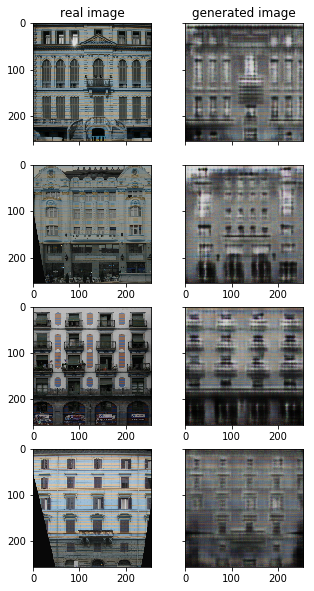

############################


Epoch: 1/150
train_G_loss: 33.535 train_D_loss: 2.629
val_G_loss: 35.510 val_D_loss: 1.903
############################


Epoch: 2/150
train_G_loss: 32.435 train_D_loss: 2.525
val_G_loss: 35.636 val_D_loss: 1.891


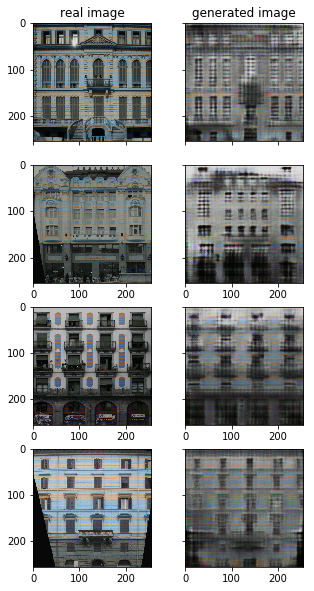

############################


Epoch: 3/150
train_G_loss: 31.760 train_D_loss: 2.357
val_G_loss: 38.565 val_D_loss: 2.330
############################


Epoch: 4/150
train_G_loss: 30.834 train_D_loss: 2.332
val_G_loss: 37.113 val_D_loss: 2.873


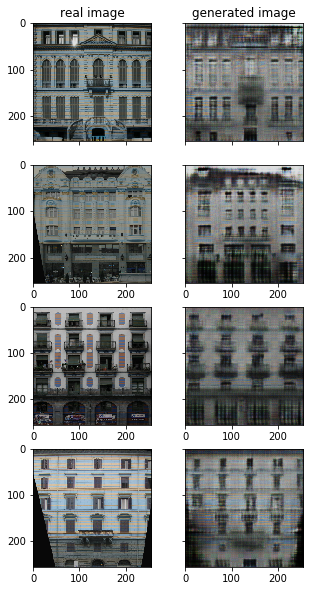

############################


Epoch: 5/150
train_G_loss: 29.843 train_D_loss: 2.452
val_G_loss: 37.342 val_D_loss: 2.891
############################


Epoch: 6/150
train_G_loss: 29.028 train_D_loss: 2.264
val_G_loss: 34.731 val_D_loss: 2.226


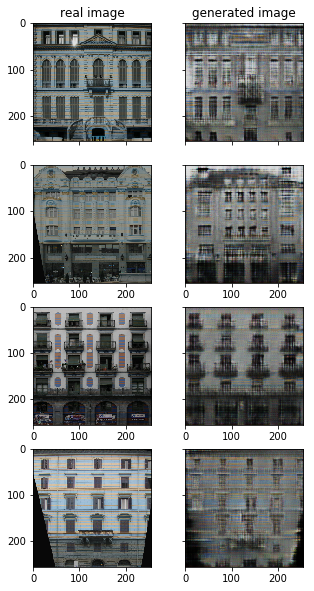

############################


Epoch: 7/150
train_G_loss: 28.354 train_D_loss: 2.219
val_G_loss: 40.488 val_D_loss: 5.372
############################


Epoch: 8/150
train_G_loss: 27.663 train_D_loss: 2.284
val_G_loss: 36.127 val_D_loss: 2.651


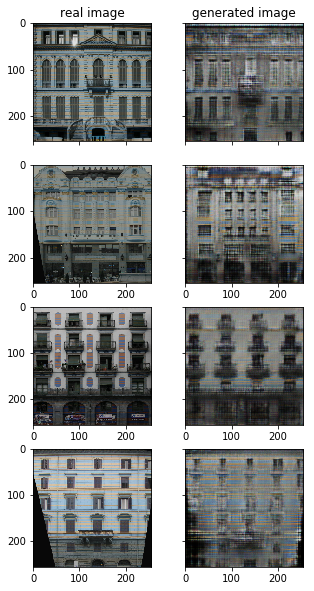

############################


Epoch: 9/150
train_G_loss: 27.165 train_D_loss: 2.275
val_G_loss: 36.284 val_D_loss: 3.348
############################


Epoch: 10/150
train_G_loss: 26.557 train_D_loss: 2.181
val_G_loss: 36.932 val_D_loss: 1.866


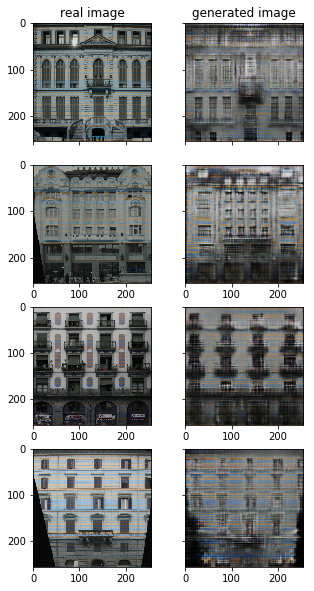

############################


Epoch: 11/150
train_G_loss: 26.228 train_D_loss: 2.115
val_G_loss: 36.974 val_D_loss: 3.344
############################


Epoch: 12/150
train_G_loss: 25.812 train_D_loss: 2.104
val_G_loss: 39.386 val_D_loss: 5.257


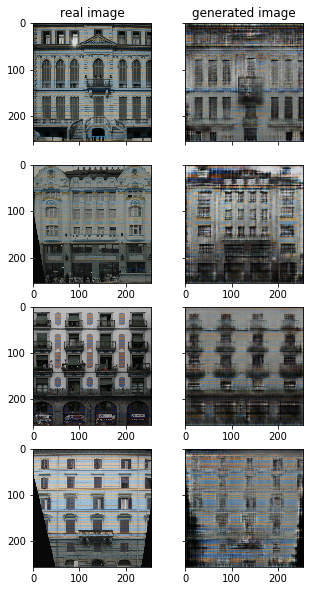

############################


Epoch: 13/150
train_G_loss: 25.451 train_D_loss: 2.026
val_G_loss: 36.977 val_D_loss: 2.080
############################


Epoch: 14/150
train_G_loss: 25.205 train_D_loss: 2.090
val_G_loss: 37.751 val_D_loss: 3.951


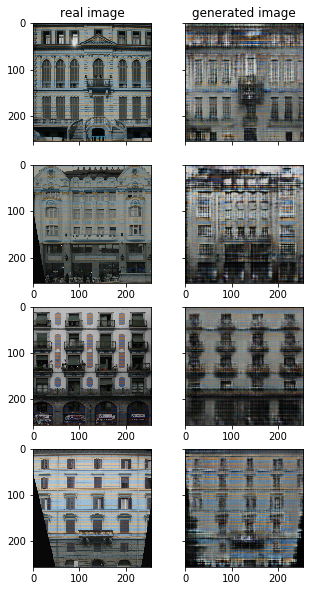

############################


Epoch: 15/150
train_G_loss: 24.718 train_D_loss: 2.061
val_G_loss: 36.502 val_D_loss: 3.499
############################


Epoch: 16/150
train_G_loss: 24.584 train_D_loss: 2.023
val_G_loss: 34.110 val_D_loss: 1.603


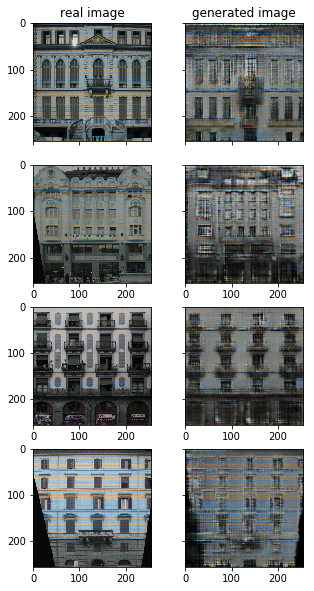

############################


Epoch: 17/150
train_G_loss: 24.410 train_D_loss: 1.940
val_G_loss: 36.149 val_D_loss: 3.084
############################


Epoch: 18/150
train_G_loss: 24.138 train_D_loss: 1.983
val_G_loss: 36.748 val_D_loss: 3.358


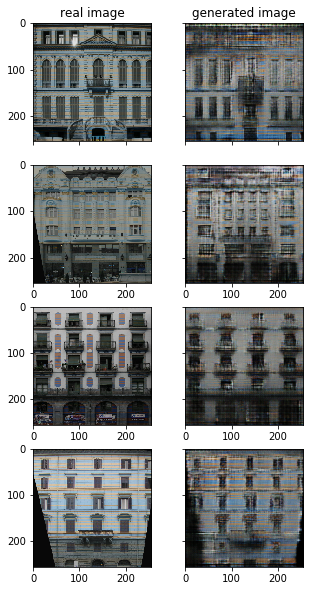

############################


Epoch: 19/150
train_G_loss: 24.062 train_D_loss: 1.979
val_G_loss: 36.581 val_D_loss: 2.869
############################


Epoch: 20/150
train_G_loss: 24.013 train_D_loss: 1.930
val_G_loss: 35.884 val_D_loss: 2.574


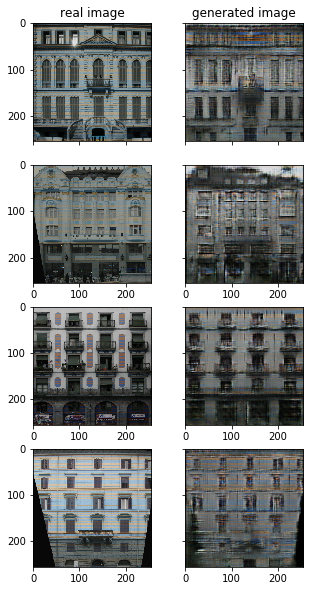

############################


Epoch: 21/150
train_G_loss: 23.766 train_D_loss: 1.817
val_G_loss: 37.291 val_D_loss: 2.937
############################


Epoch: 22/150
train_G_loss: 23.894 train_D_loss: 1.856
val_G_loss: 38.200 val_D_loss: 4.341


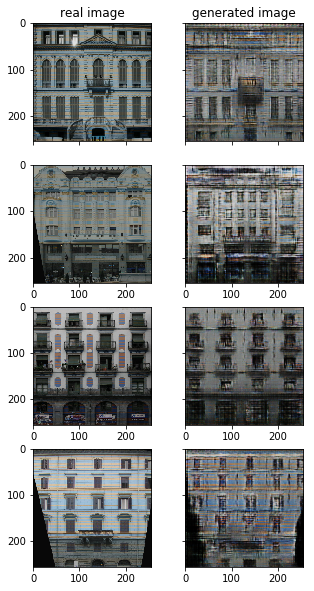

############################


Epoch: 23/150
train_G_loss: 23.798 train_D_loss: 1.813
val_G_loss: 35.906 val_D_loss: 1.793
############################


Epoch: 24/150
train_G_loss: 23.570 train_D_loss: 1.862
val_G_loss: 37.931 val_D_loss: 3.874


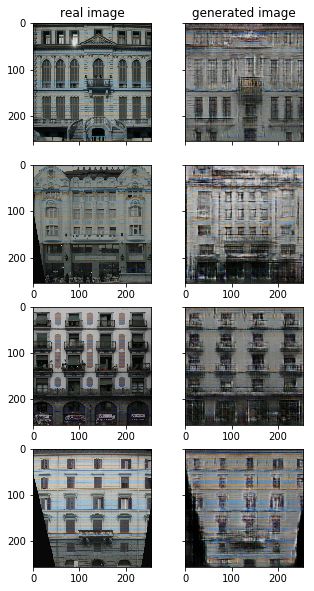

############################


Epoch: 25/150
train_G_loss: 23.429 train_D_loss: 1.853
val_G_loss: 36.913 val_D_loss: 3.285
############################


Epoch: 26/150
train_G_loss: 23.377 train_D_loss: 1.752
val_G_loss: 34.626 val_D_loss: 2.306


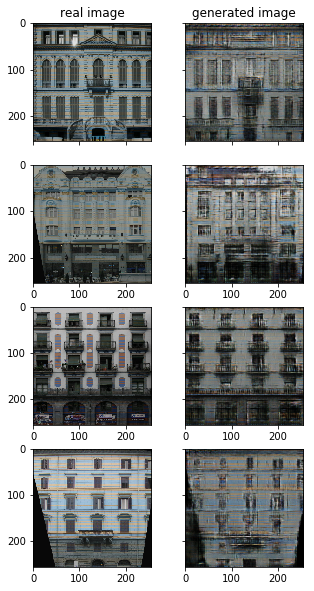

############################


Epoch: 27/150
train_G_loss: 23.405 train_D_loss: 1.781
val_G_loss: 35.895 val_D_loss: 2.477
############################


Epoch: 28/150
train_G_loss: 23.384 train_D_loss: 1.726
val_G_loss: 35.926 val_D_loss: 2.517


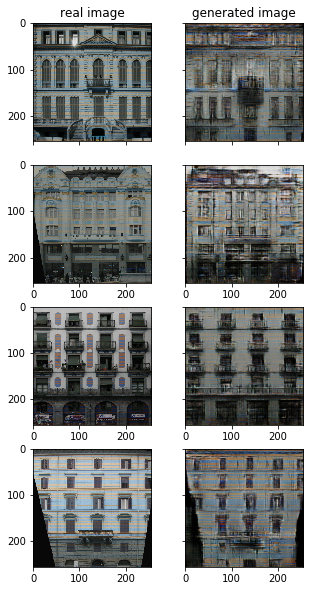

############################


Epoch: 29/150
train_G_loss: 23.372 train_D_loss: 1.674
val_G_loss: 33.958 val_D_loss: 2.540
############################


Epoch: 30/150
train_G_loss: 23.287 train_D_loss: 1.641
val_G_loss: 35.305 val_D_loss: 2.330


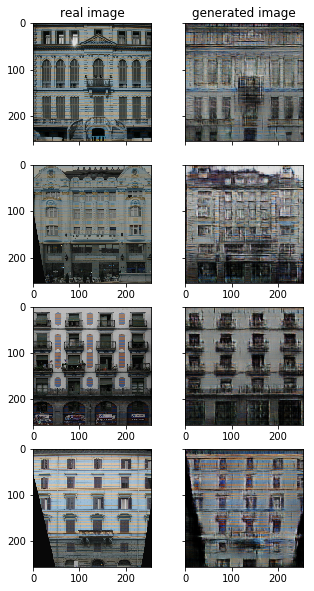

############################


Epoch: 31/150
train_G_loss: 23.199 train_D_loss: 1.676
val_G_loss: 35.537 val_D_loss: 2.391
############################


Epoch: 32/150
train_G_loss: 23.172 train_D_loss: 1.632
val_G_loss: 34.777 val_D_loss: 2.354


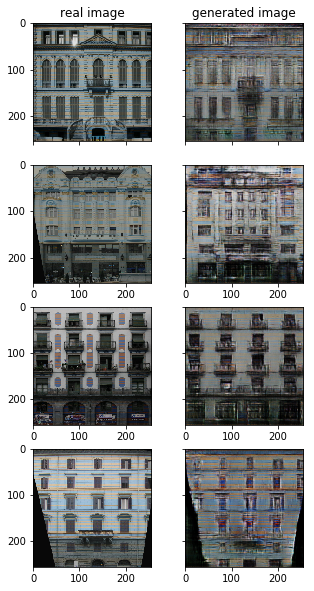

############################


Epoch: 33/150
train_G_loss: 23.222 train_D_loss: 1.629
val_G_loss: 36.233 val_D_loss: 1.719
############################


Epoch: 34/150
train_G_loss: 23.054 train_D_loss: 1.574
val_G_loss: 36.166 val_D_loss: 1.630


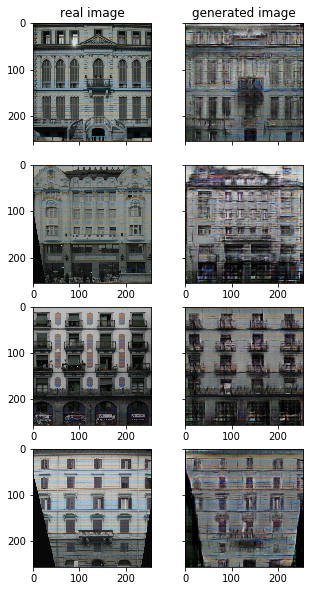

############################


Epoch: 35/150
train_G_loss: 23.070 train_D_loss: 1.561
val_G_loss: 35.128 val_D_loss: 1.613
############################


Epoch: 36/150
train_G_loss: 23.196 train_D_loss: 1.504
val_G_loss: 35.114 val_D_loss: 2.179


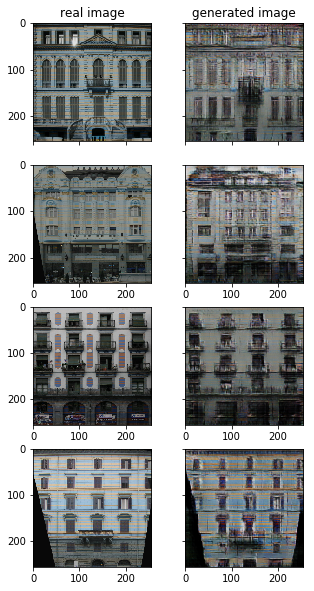

############################


Epoch: 37/150
train_G_loss: 23.035 train_D_loss: 1.422
val_G_loss: 33.284 val_D_loss: 1.760
############################


Epoch: 38/150
train_G_loss: 23.175 train_D_loss: 1.486
val_G_loss: 34.208 val_D_loss: 1.551


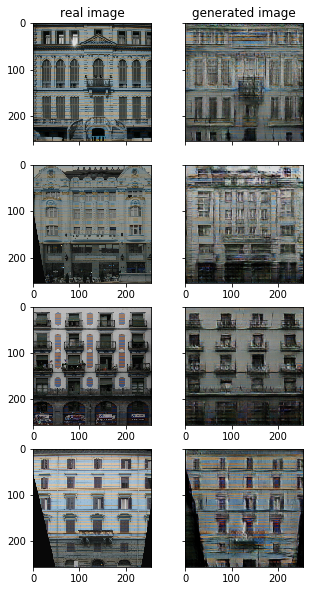

############################


Epoch: 39/150
train_G_loss: 23.026 train_D_loss: 1.471
val_G_loss: 36.818 val_D_loss: 2.932
############################


Epoch: 40/150
train_G_loss: 22.942 train_D_loss: 1.428
val_G_loss: 33.951 val_D_loss: 1.453


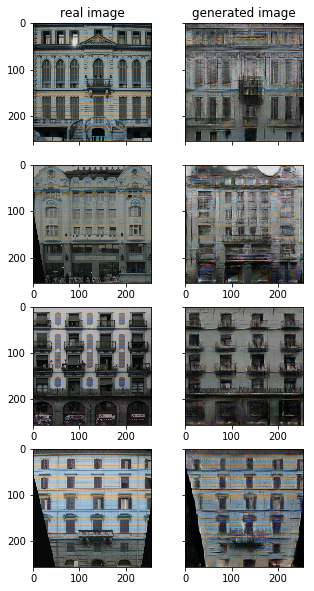

############################


Epoch: 41/150
train_G_loss: 23.159 train_D_loss: 1.321
val_G_loss: 35.884 val_D_loss: 0.598
############################


Epoch: 42/150
train_G_loss: 23.139 train_D_loss: 1.380
val_G_loss: 34.916 val_D_loss: 1.214


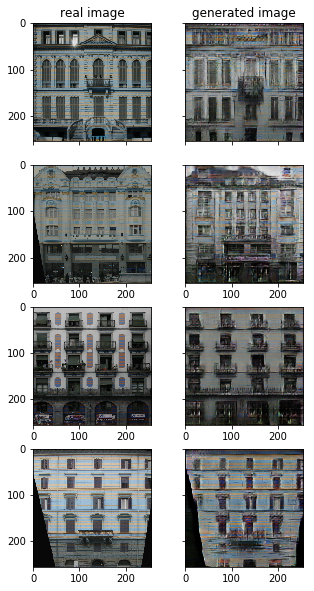

############################


Epoch: 43/150
train_G_loss: 23.151 train_D_loss: 1.360
val_G_loss: 34.475 val_D_loss: 1.558
############################


Epoch: 44/150
train_G_loss: 23.135 train_D_loss: 1.362
val_G_loss: 35.416 val_D_loss: 0.987


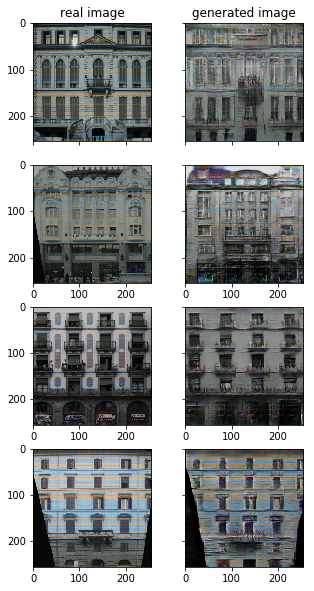

############################


Epoch: 45/150
train_G_loss: 23.203 train_D_loss: 1.364
val_G_loss: 34.788 val_D_loss: 1.957
############################


Epoch: 46/150
train_G_loss: 23.042 train_D_loss: 1.307
val_G_loss: 37.448 val_D_loss: 1.769


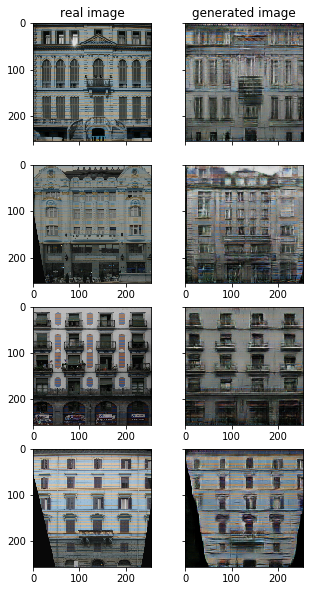

############################


Epoch: 47/150
train_G_loss: 22.974 train_D_loss: 1.270
val_G_loss: 34.404 val_D_loss: 1.153
############################


Epoch: 48/150
train_G_loss: 23.107 train_D_loss: 1.291
val_G_loss: 37.699 val_D_loss: 2.341


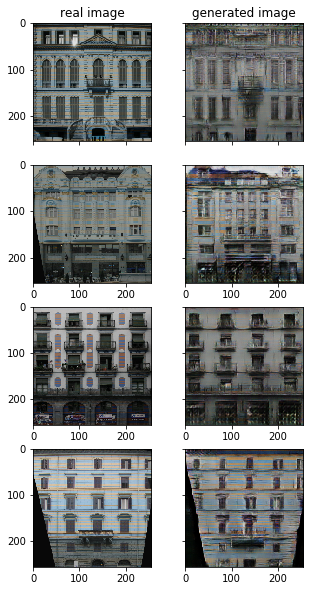

############################


Epoch: 49/150
train_G_loss: 23.114 train_D_loss: 1.165
val_G_loss: 37.564 val_D_loss: 1.434
############################


Epoch: 50/150
train_G_loss: 23.332 train_D_loss: 1.252
val_G_loss: 38.760 val_D_loss: 1.791


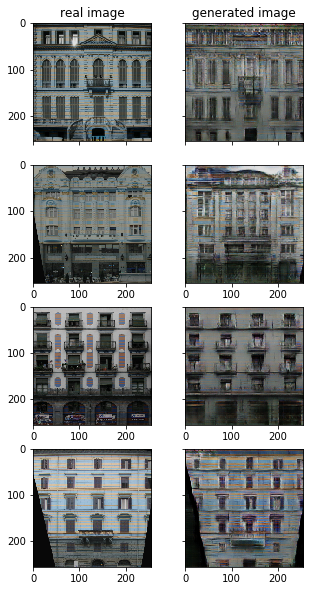

############################


Epoch: 51/150
train_G_loss: 23.127 train_D_loss: 1.228
val_G_loss: 38.710 val_D_loss: 2.866
############################


Epoch: 52/150
train_G_loss: 23.119 train_D_loss: 1.252
val_G_loss: 36.641 val_D_loss: 1.410


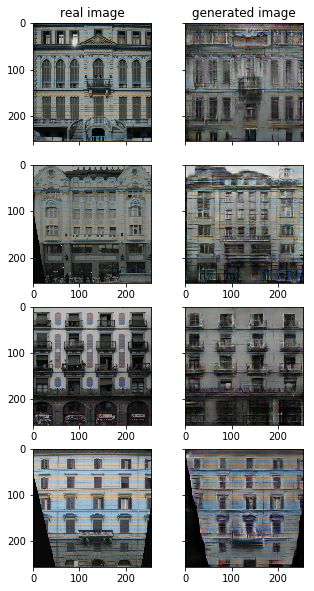

############################


Epoch: 53/150
train_G_loss: 23.274 train_D_loss: 1.219
val_G_loss: 36.404 val_D_loss: 1.715
############################


Epoch: 54/150
train_G_loss: 23.243 train_D_loss: 1.108
val_G_loss: 37.859 val_D_loss: 2.712


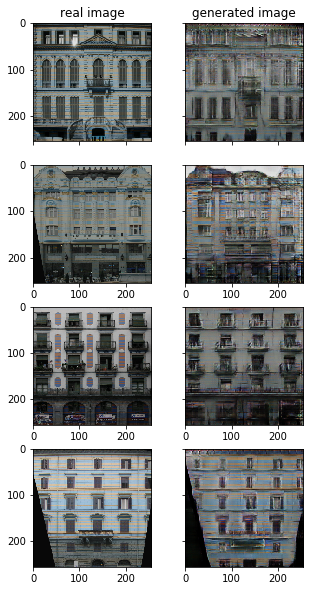

############################


Epoch: 55/150
train_G_loss: 23.259 train_D_loss: 1.072
val_G_loss: 33.671 val_D_loss: 0.567
############################


Epoch: 56/150
train_G_loss: 23.299 train_D_loss: 1.146
val_G_loss: 36.871 val_D_loss: 0.738


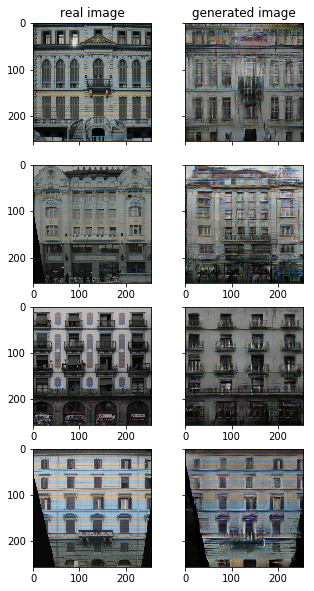

############################


Epoch: 57/150
train_G_loss: 23.379 train_D_loss: 1.074
val_G_loss: 35.763 val_D_loss: 0.659
############################


Epoch: 58/150
train_G_loss: 23.481 train_D_loss: 1.002
val_G_loss: 38.231 val_D_loss: 1.605


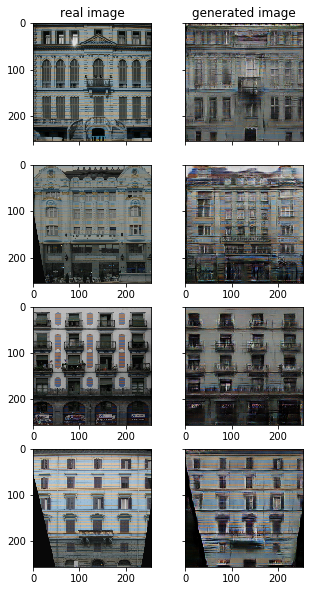

############################


Epoch: 59/150
train_G_loss: 23.559 train_D_loss: 1.114
val_G_loss: 35.201 val_D_loss: 0.753
############################


Epoch: 60/150
train_G_loss: 23.529 train_D_loss: 1.067
val_G_loss: 41.578 val_D_loss: 3.167


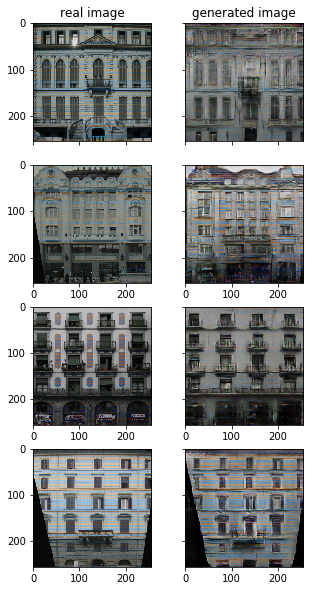

############################


Epoch: 61/150
train_G_loss: 23.478 train_D_loss: 1.081
val_G_loss: 35.318 val_D_loss: 1.246
############################


Epoch: 62/150
train_G_loss: 23.594 train_D_loss: 1.056
val_G_loss: 33.809 val_D_loss: 2.022


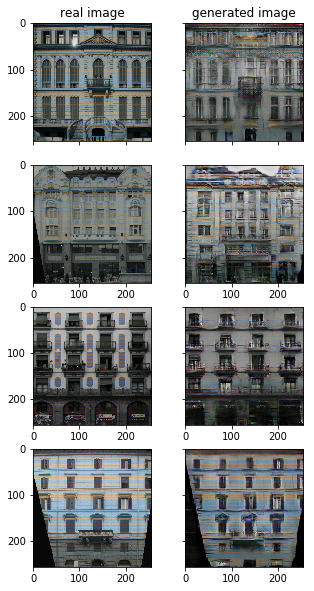

############################


Epoch: 63/150
train_G_loss: 23.637 train_D_loss: 1.059
val_G_loss: 36.487 val_D_loss: 1.229
############################


Epoch: 64/150
train_G_loss: 23.642 train_D_loss: 0.951
val_G_loss: 38.208 val_D_loss: 0.688


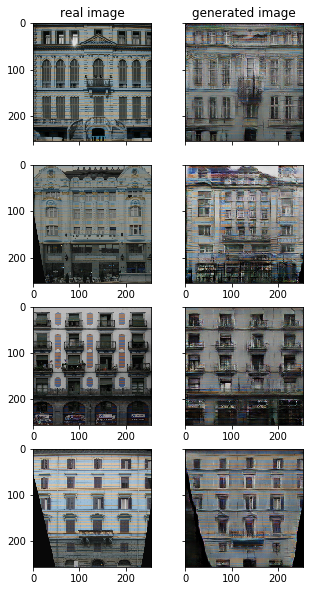

############################


Epoch: 65/150
train_G_loss: 23.689 train_D_loss: 1.022
val_G_loss: 35.945 val_D_loss: 0.537
############################


Epoch: 66/150
train_G_loss: 23.733 train_D_loss: 0.988
val_G_loss: 34.133 val_D_loss: 1.609


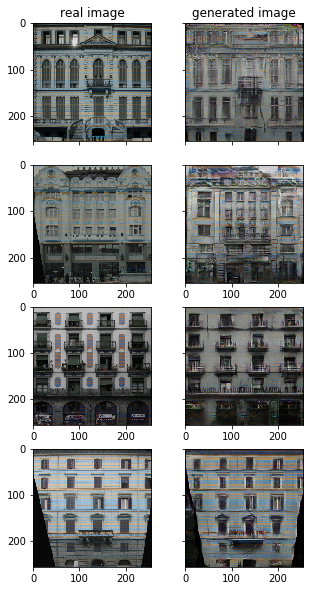

############################


KeyboardInterrupt: 

In [33]:
epoch_bar = tqdm(range(nb_epoch), desc="epoch", unit="epoch")
for epoch in epoch_bar:
    train_batch_bar = tqdm(range(n_batch), desc="train_batch", unit="batch", leave=False)
    
    for batch in train_batch_bar:
        x, y = generators.train_queue.get()
        
        _, discriminator_loss = sess.run([D_update, D_loss], feed_dict={real_img_A: x, real_img_B: y, is_training: True})
        model_dict['train_batch_log'].push({'d_loss':discriminator_loss})
        
        _, generator_loss = sess.run([G_update, G_loss], feed_dict={real_img_A: x, real_img_B: y, is_training: True})
        model_dict['train_batch_log'].push({'g_loss':generator_loss})
        
    model_dict['history']['train_g_loss'].append(model_dict['train_batch_log'].avg_value('g_loss'))
    model_dict['history']['train_d_loss'].append(model_dict['train_batch_log'].avg_value('d_loss'))
    model_dict['train_batch_log'].reset()
    
    val_batch_bar = tqdm(generators.iter_val(), total=generators.val_len, desc="val_batch" , unit="batch", leave=False)
    val_image_pair = []
    for x, y, length in val_batch_bar:
        generator_loss, discriminator_loss, gen_img = sess.run([G_loss, D_loss, fake_img_B], feed_dict={real_img_A: x, real_img_B: y, is_training: False})
        val_image_pair = [y[: 4], gen_img[: 4]]
        model_dict['val_batch_log'].push({'g_loss': generator_loss, 'd_loss': discriminator_loss}, length)
    
    model_dict['history']['val_g_loss'].append(model_dict['val_batch_log'].avg_value('g_loss'))
    model_dict['history']['val_d_loss'].append(model_dict['val_batch_log'].avg_value('d_loss'))
    model_dict['val_batch_log'].reset()
    
    print('Epoch: {}/{}'.format(epoch, nb_epoch))
    print('train_G_loss: {:.3f}'.format(model_dict['history']['train_g_loss'][-1]),
         'train_D_loss: {:.3f}'.format(model_dict['history']['train_d_loss'][-1]))
    print('val_G_loss: {:.3f}'.format(model_dict['history']['val_g_loss'][-1]),
         'val_D_loss: {:.3f}'.format(model_dict['history']['val_d_loss'][-1]))

    
    ### draw image ###
    if epoch%2 == 0:
        fig = plot(val_image_pair)
        plt.show()
        plt.close(fig)

    callback_manager.run_on_epoch_end(val_loss = model_dict['history']['val_g_loss'][-1],
                                      sess = sess,
                                      saver = saver,
                                      nth_epoch = epoch)
    print('############################')